In [55]:
# Get thinkdsp.py

import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py
    
import numpy as np
import matplotlib.pyplot as plt

from thinkdsp import decorate
from thinkdsp import read_wave

# Упражнение 1
На сайте Soft Murmur можно послушать множество природных источников шума включая дождь волны, ветер, и др. На веб-странице http://asoftmurmur.com/about привелен перечень записей; большинство из них хранится на http://freesound.org.

Скачайте некоторые из этих файлов и вычислите спектры каждого сигнала. Похож ли их спектр мощности на белый розовый или броуновский шум? Как спектр меняется во времени?

In [56]:
if not os.path.exists('264598__cdrk__heavy-rain.wav'):
    !wget https://github.com/donebd/telecom_spbstu2022/raw/main/res/lab4/264598__cdrk__heavy-rain.wav

In [ ]:
from thinkdsp import read_wave

wave = read_wave('264598__cdrk__heavy-rain.wav')
wave.make_audio()

In [ ]:
segment = wave.segment(start=6, duration=1.0)
segment.make_audio()

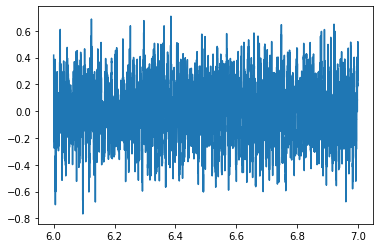

In [ ]:
segment.plot()

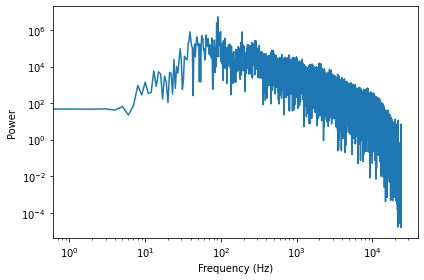

In [ ]:
from thinkdsp import decorate
spectrum = segment.make_spectrum()
spectrum.plot_power()

loglog = dict(xscale='log', yscale='log')
decorate(xlabel='Frequency (Hz)',
         ylabel='Power', 
         **loglog)

Если не смотреть на герцовку до 100 герц, то график очень похож на броуновский шум.

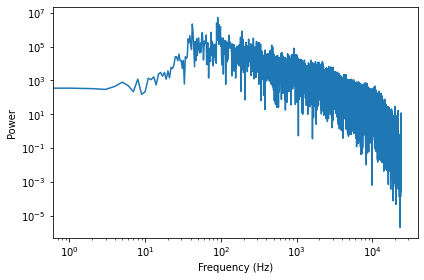

In [ ]:
segment = wave.segment(start=7, duration=1.0)
segment.make_audio()
spectrum = segment.make_spectrum()
spectrum.plot_power()

loglog = dict(xscale='log', yscale='log')
decorate(xlabel='Frequency (Hz)',
         ylabel='Power', 
         **loglog)

То же самое можно сказать про спектр сегмента секунду спустя.

# Упражнение 2
В шумовом сигнале частотный состав меняется во времени. На большом интервале мощность на всех частотах одинакова, а на коротком мощность на каждой частоте случайна.

Для оценки долговременной средней мощности на каждой частоте можно разорвать сигнал на сегменты, вычислить спектр мощности для каждого сегмента, а затем найти среднее по сегментам. Подробнее: http://en.wikipedia.org/wiki/Bartlett's_method

Реализуйте метод Бартлетта и используйте его для оценки спектра мощности шумового сигнала.

In [ ]:
from thinkdsp import Spectrum

def make_barlett(wave, N, flag=True):
  spectrogram = wave.make_spectrogram(N,flag)
  spec_mac = spectrogram.spec_map.values()

  powers = []
  for spectrum in spec_mac:
    powers.append(spectrum.power)
  
  hs = np.sqrt(sum(powers)/ len(powers))
  fs = next(iter(spec_mac)).fs

  return Spectrum(hs, fs, wave.framerate)

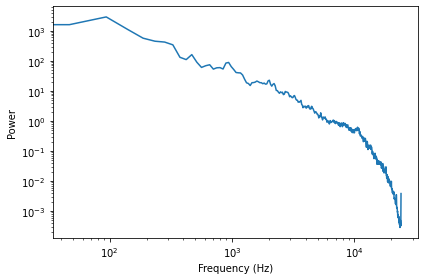

In [ ]:
barlett = make_barlett(segment,1024)
barlett.plot_power()

decorate(xlabel='Frequency (Hz)', 
         ylabel='Power', 
         **loglog)

Стало еще болшье похоже на шум Гаусса, если исключить "аномалию" в конце графика.

# Упражнение 3
На веб-странице http://www.coindesk.com/price можно скачать в виде CSV-файла исторические данные о ежедневной цене BitCoin. Откройте этот файл и вычислите спектр цен BitCoin как функцию времени. Похоже ли это на белый, розовый, или броуновский шум?

In [86]:
  if not os.path.exists('btc_daily_mention.csv'):
    !wget https://github.com/donebd/telecom_spbstu2022/raw/main/res/lab4/btc_daily_mention.csv

--2022-04-03 22:09:52--  https://github.com/donebd/telecom_spbstu2022/raw/main/res/lab4/btc_daily_mention.csv
Resolving github.com (github.com)... 13.114.40.48
Connecting to github.com (github.com)|13.114.40.48|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/donebd/telecom_spbstu2022/main/res/lab4/btc_daily_mention.csv [following]
--2022-04-03 22:09:52--  https://raw.githubusercontent.com/donebd/telecom_spbstu2022/main/res/lab4/btc_daily_mention.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 356 [text/plain]
Saving to: ‘btc_daily_mention.csv’

btc_daily_mention.c 100%[===================>]     356  --.-KB/s    in 0s      

2022-04-03 22:09:52 (13.0 MB/s) - ‘btc_daily_mention.csv’ saved [35

In [87]:
import csv

worth = []

with open('btc_daily_mention.csv') as File:
  reader = csv.reader(File, delimiter=',', quotechar=',',
                        quoting=csv.QUOTE_MINIMAL)
  worth = [row[0] for row in reader]

worth = worth [1:]
days = a=np.arange(0,len(worth))

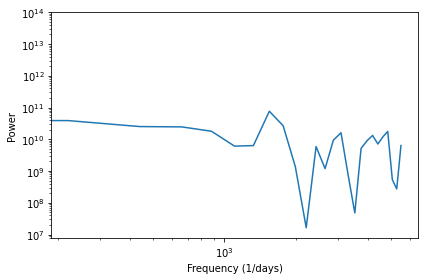

In [105]:
from thinkdsp import Wave

wave = Wave(worth,days)
spectrum = wave.make_spectrum()
spectrum.plot_power()
decorate(xlabel='Frequency (1/days)',
         ylabel='Power', 
         **loglog)

Это не похоже ни на один из шумов. Может из за маленькой выборки, но другой я не нашел ☹


# Упражнение 4
Счетчик Гейгера - прибор для обнаружения радиации. Когда ионизирующие частицы попадают в детектор, на его выходе появляются импульсы тока. Общий выход в определенный момент времени можно смоделировать некоррелированным пуассоновым шумом, где каждая выборка есть случайное число из распределения Пуассона, соответсвующее количеству частиц, обнаруженных за интервал измерения.

Напишите класс, называемый UncorrelatedPoissonNoise, наследующий thinkdsp._Noise и предоставляющий evaluate. Следует использовать Np.random.poisson для генерации случайных величин из распределения Пуассона. Параметр этой функции lam — это среднее число частиц за время каждого интервала. Можно использо-
вать атрибут amp для определения lam. Например, при частоте кадров 10 кГц amp 0,001 получится около 10 «щелчков» в секунду.

Сгенерируйте пару секунд UP и прослушайте. Для малых значений amp, например 0,001, звук будет как у счетчика Гейгера. При больших значениях он будет похож на белый шум. Вычислите и напечатайте спектр мощности и посмотрите, так ли это.


In [98]:
from thinkdsp import Noise

class UncorrelatedPoissonNoise(Noise):
  def evaluate(self, ts):
    ys = np.random.poisson(self.amp,len(ts))
    return ys

In [99]:
noise1 = UncorrelatedPoissonNoise(0.001)
wave1 = noise1.make_wave(duration=1,framerate = 11025)
wave1.make_audio()

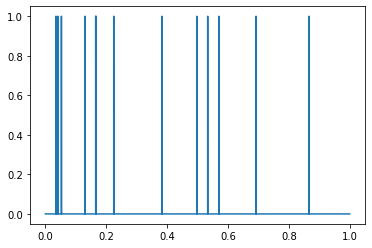

In [100]:
wave1.plot()

In [101]:
noise2 = UncorrelatedPoissonNoise(1)
wave2 = noise2.make_wave(duration=1,framerate = 11025)
wave2.make_audio()

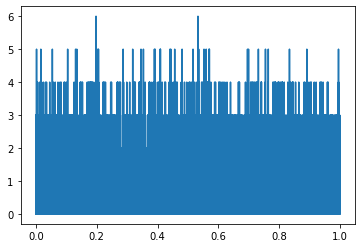

In [102]:
wave2.plot()

In [103]:
spectrum1 = wave1.make_spectrum()
spectrum2 = wave2.make_spectrum()

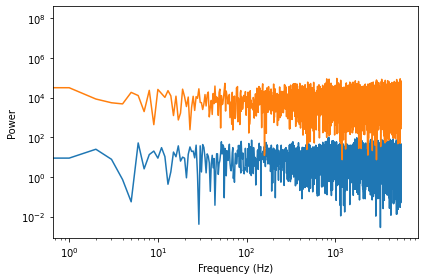

In [104]:
spectrum1.plot_power()
spectrum2.plot_power()

decorate(xlabel='Frequency (Hz)', 
         ylabel='Power', 
         **loglog)

При увеличении значения ампилутуды сигнал всё больше походит на белый шум.

# Упражнение 5
В этой главе алгоритм для генерации розового шума концептуально простой, но затратный. Существуют более эффективные варианты, например алгоритм Voss-McCartney. Изучите этот способ, реализуйте его, вычислите спектр результата и убедитесь, что соотношение между мощностью и частотой соответствующее.

In [106]:
def iterpink(depth):
    values = np.random.randn(depth)
    smooth = np.random.randn(depth)
    source = np.random.randn(depth)
    sumvals = values.sum()
    i = 0
    while True:
        yield sumvals + smooth[i]
        i += 1
        if i == depth:
            i = 0
            smooth = np.random.randn(depth)
            source = np.random.randn(depth)
            continue
        c = 0
        while not (i >> c) & 1:
            c += 1
        sumvals += source[i] - values[c]
        values[c] = source[i]

In [107]:
def pink_noise(points, depth=16):
    a = []
    s = iterpink(depth)
    for n in range(points):
        a.append(next(s))
    return np.array(a)

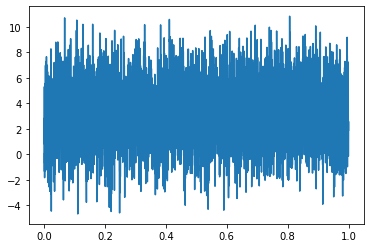

In [109]:
ys = pink_noise(11025,16)
wave = Wave(ys)
wave.plot()

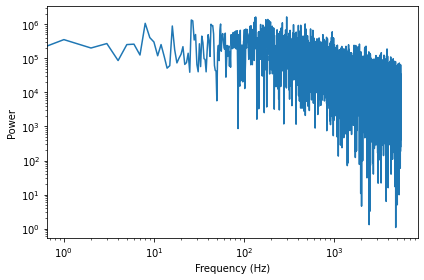

In [112]:
spectrum = wave.make_spectrum()
spectrum.hs[0] = 0
spectrum.plot_power()
decorate(xlabel='Frequency (Hz)',
         ylabel='Power',
         **loglog)
wave.make_audio()

Все работает, мы получили розовый шум =)